### Importación de datos



In [17]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


##CONOCIENDO EL CONJUNTO DE DATOS

In [18]:
print("Tienda 1:", tienda.shape)
print("Tienda 2:", tienda2.shape)
print("Tienda 3:", tienda3.shape)
print("Tienda 4:", tienda4.shape)


display(tienda.columns)
display(tienda.dtypes)
display(tienda.isnull().sum())

Tienda 1: (2359, 12)
Tienda 2: (2359, 12)
Tienda 3: (2359, 12)
Tienda 4: (2358, 12)


Index(['Producto', 'Categoría del Producto', 'Precio', 'Costo de envío',
       'Fecha de Compra', 'Vendedor', 'Lugar de Compra', 'Calificación',
       'Método de pago', 'Cantidad de cuotas', 'lat', 'lon'],
      dtype='object')

,0
Producto,object
Categoría del Producto,object
Precio,float64
Costo de envío,float64
Fecha de Compra,object
Vendedor,object
Lugar de Compra,object
Calificación,int64
Método de pago,object
Cantidad de cuotas,int64


,0
Producto,0
Categoría del Producto,0
Precio,0
Costo de envío,0
Fecha de Compra,0
Vendedor,0
Lugar de Compra,0
Calificación,0
Método de pago,0
Cantidad de cuotas,0


#1. Análisis de facturación



In [19]:
import matplotlib.pyplot as plt
ingreso_tienda = tienda["Precio"].sum()
ingreso_tienda2 = tienda2["Precio"].sum()
ingreso_tienda3 = tienda3["Precio"].sum()
ingreso_tienda4 = tienda4["Precio"].sum()

ingresos = pd.DataFrame({
    "Tienda": ["Tienda 1", "Tienda 2", "Tienda 3", "Tienda 4"],
    "Ingreso Total": [ingreso_tienda, ingreso_tienda2, ingreso_tienda3, ingreso_tienda4]
})

print("Ingreso total por tienda:")
display(ingresos)


💰 Ingreso total por tienda:


,Tienda,Ingreso Total
0,Tienda 1,1.150880e+09
1,Tienda 2,1.116344e+09
2,Tienda 3,1.098020e+09
3,Tienda 4,1.038376e+09


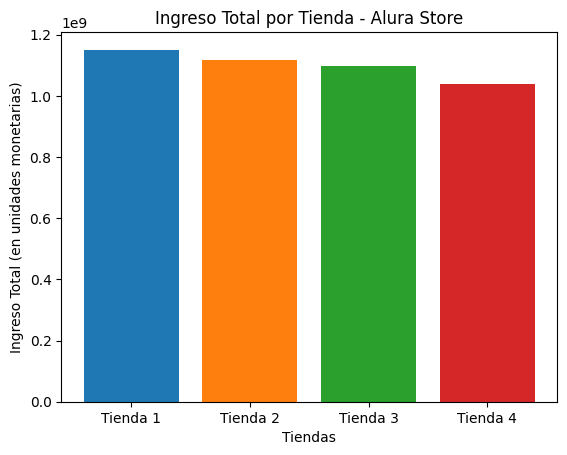

In [20]:
import matplotlib.pyplot as plt

plt.bar(ingresos["Tienda"], ingresos["Ingreso Total"], color=["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728"])
plt.title("Ingreso Total por Tienda - Alura Store")
plt.xlabel("Tiendas")
plt.ylabel("Ingreso Total (en unidades monetarias)")
plt.show()

# 2. Ventas por categoría

In [21]:
ventas_cat_t1 = tienda['Categoría del Producto'].value_counts()
ventas_cat_t2 = tienda2['Categoría del Producto'].value_counts()
ventas_cat_t3 = tienda3['Categoría del Producto'].value_counts()
ventas_cat_t4 = tienda4['Categoría del Producto'].value_counts()


ventas_categoria = pd.DataFrame({
    'Tienda 1': ventas_cat_t1,
    'Tienda 2': ventas_cat_t2,
    'Tienda 3': ventas_cat_t3,
    'Tienda 4': ventas_cat_t4
}).fillna(0).astype(int)

print("Cantidad de productos vendidos por categoría:")
display(ventas_categoria)

📊 Cantidad de productos vendidos por categoría:


,Tienda 1,Tienda 2,Tienda 3,Tienda 4
Categoría del Producto,,,,
Artículos para el hogar,171,181,177,201
Deportes y diversión,284,275,277,277
Electrodomésticos,312,305,278,254
Electrónicos,448,422,451,451
Instrumentos musicales,182,224,177,170
Juguetes,324,313,315,338
Libros,173,197,185,187
Muebles,465,442,499,480


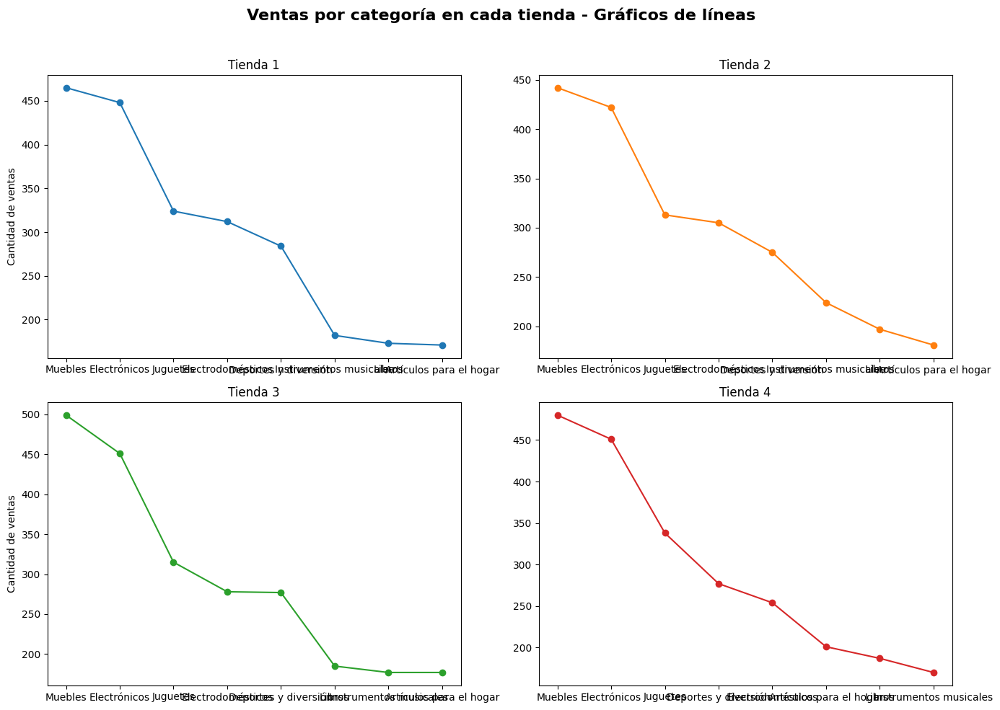

In [22]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Ventas por categoría en cada tienda - Gráficos de líneas', fontsize=16, fontweight='bold')

axes[0, 0].plot(ventas_cat_t1.index, ventas_cat_t1.values, marker='o', linestyle='-', color='#1f77b4')
axes[0, 0].set_title('Tienda 1')
axes[0, 0].set_ylabel('Cantidad de ventas')


axes[0, 1].plot(ventas_cat_t2.index, ventas_cat_t2.values, marker='o', linestyle='-', color='#ff7f0e')
axes[0, 1].set_title('Tienda 2')


axes[1, 0].plot(ventas_cat_t3.index, ventas_cat_t3.values, marker='o', linestyle='-', color='#2ca02c')
axes[1, 0].set_title('Tienda 3')
axes[1, 0].set_ylabel('Cantidad de ventas')


axes[1, 1].plot(ventas_cat_t4.index, ventas_cat_t4.values, marker='o', linestyle='-', color='#d62728')
axes[1, 1].set_title('Tienda 4')


plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# 3. Calificación promedio de la tienda


In [23]:
promedio_t1 = tienda['Calificación'].mean()
promedio_t2 = tienda2['Calificación'].mean()
promedio_t3 = tienda3['Calificación'].mean()
promedio_t4 = tienda4['Calificación'].mean()


valoraciones = pd.DataFrame({
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Valoración promedio': [promedio_t1, promedio_t2, promedio_t3, promedio_t4]
})


print("Valoración promedio por tienda:")
print(valoraciones.to_string(index=False))

Valoración promedio por tienda:
  Tienda  Valoración promedio
Tienda 1             3.976685
Tienda 2             4.037304
Tienda 3             4.048326
Tienda 4             3.995759


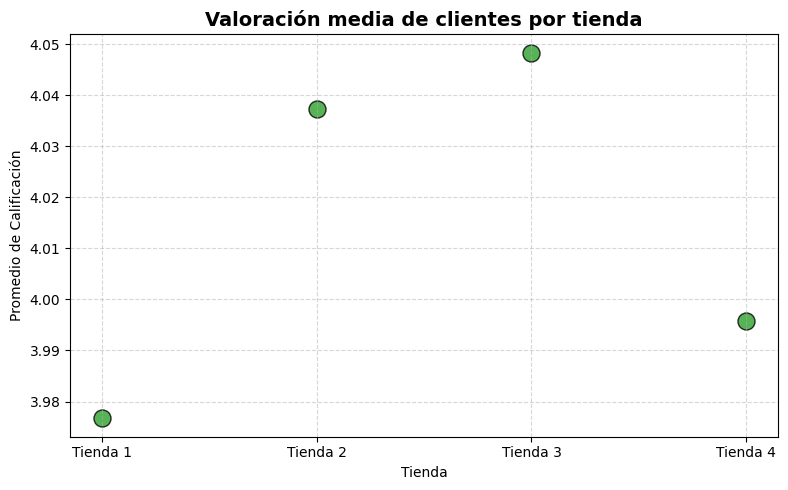

In [24]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.scatter(valoraciones['Tienda'], valoraciones['Valoración promedio'], s=150, c='#2ca02c', alpha=0.8, edgecolors='black')
plt.title('Valoración media de clientes por tienda', fontsize=14, fontweight='bold')
plt.xlabel('Tienda')
plt.ylabel('Promedio de Calificación')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos

In [25]:
ventas_t1 = tienda['Producto'].value_counts()
ventas_t2 = tienda2['Producto'].value_counts()
ventas_t3 = tienda3['Producto'].value_counts()
ventas_t4 = tienda4['Producto'].value_counts()


resumen_ventas = pd.DataFrame({
    'Tienda 1 - Más vendido': [ventas_t1.idxmax()],
    'Tienda 1 - Menos vendido': [ventas_t1.idxmin()],
    'Tienda 2 - Más vendido': [ventas_t2.idxmax()],
    'Tienda 2 - Menos vendido': [ventas_t2.idxmin()],
    'Tienda 3 - Más vendido': [ventas_t3.idxmax()],
    'Tienda 3 - Menos vendido': [ventas_t3.idxmin()],
    'Tienda 4 - Más vendido': [ventas_t4.idxmax()],
    'Tienda 4 - Menos vendido': [ventas_t4.idxmin()],
})


print("Productos más y menos vendidos por tienda:")
display(resumen_ventas)

Productos más y menos vendidos por tienda:


,Tienda 1 - Más vendido,Tienda 1 - Menos vendido,Tienda 2 - Más vendido,Tienda 2 - Menos vendido,Tienda 3 - Más vendido,Tienda 3 - Menos vendido,Tienda 4 - Más vendido,Tienda 4 - Menos vendido
0,Microondas,Auriculares con micrófono,Iniciando en programación,Juego de mesa,Kit de bancas,Bloques de construcción,Cama box,Guitarra eléctrica


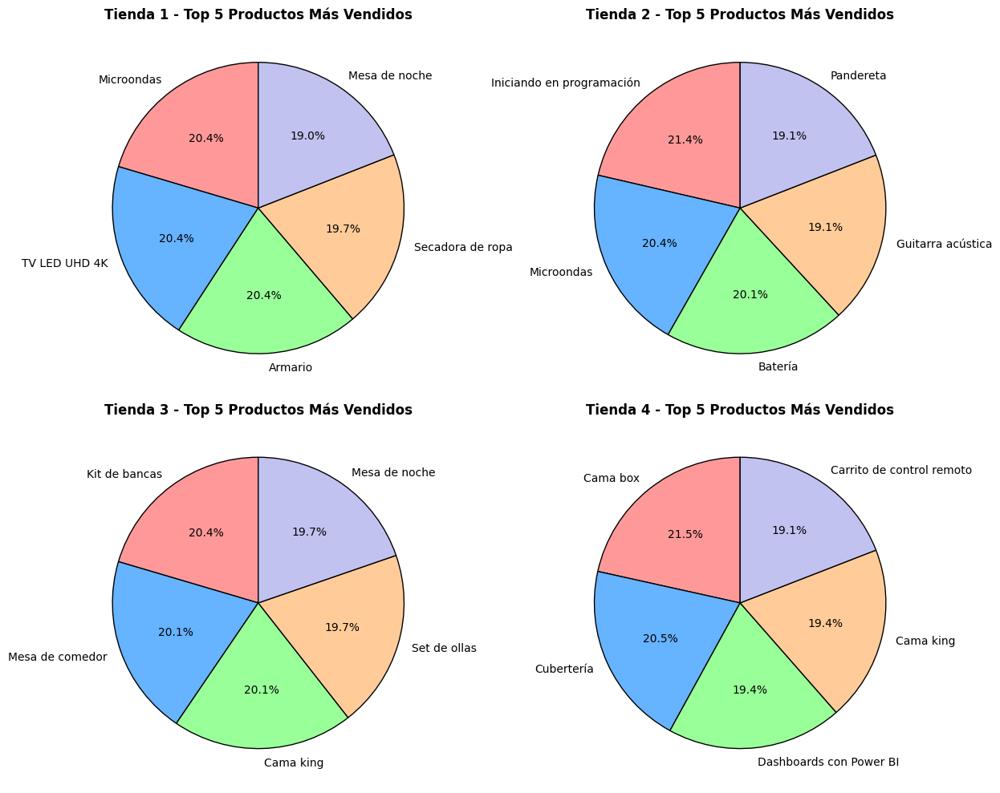

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
tiendas = [ventas_t1, ventas_t2, ventas_t3, ventas_t4]
titulos = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']
colores = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']

for i, ax in enumerate(axes.flatten()):
    ventas = tiendas[i]
    top_productos = ventas.head(5)
    ax.pie(top_productos.values,
           labels=top_productos.index,
           autopct='%1.1f%%',
           startangle=90,
           colors=colores,
           wedgeprops={'edgecolor': 'black'})
    ax.set_title(f'{titulos[i]} - Top 5 Productos Más Vendidos', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

# 5. Envío promedio por tienda

In [27]:
import matplotlib.pyplot as plt
import pandas as pd

envio_prom_t1 = tienda['Costo de envío'].astype(float).mean()
envio_prom_t2 = tienda2['Costo de envío'].astype(float).mean()
envio_prom_t3 = tienda3['Costo de envío'].astype(float).mean()
envio_prom_t4 = tienda4['Costo de envío'].astype(float).mean()

envios_prom = pd.DataFrame({
    'Tienda': ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4'],
    'Costo de Envío Promedio': [envio_prom_t1, envio_prom_t2, envio_prom_t3, envio_prom_t4]
})

display(envios_prom)

,Tienda,Costo de Envío Promedio
0,Tienda 1,26018.609580
1,Tienda 2,25216.235693
2,Tienda 3,24805.680373
3,Tienda 4,23459.457167


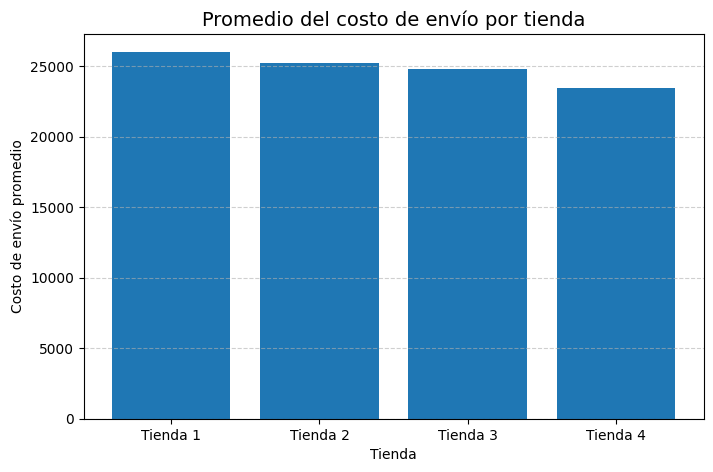

In [28]:
plt.figure(figsize=(8,5))
plt.bar(envios_prom['Tienda'], envios_prom['Costo de Envío Promedio'])
plt.title("Promedio del costo de envío por tienda", fontsize=14)
plt.xlabel("Tienda")
plt.ylabel("Costo de envío promedio")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.show()

# Informe Final – Análisis de Tiendas Alura Store

## Introducción

El presente análisis tiene como objetivo ayudar al **Sr. Juan** a decidir **qué tienda de la cadena Alura Store debería vender** para iniciar un nuevo emprendimiento.  
Para ello, se analizaron los datos de las cuatro tiendas (**Tienda 1**, **Tienda 2**, **Tienda 3** y **Tienda 4**), considerando métricas como:

- Ingresos totales
- Categorías de productos más y menos vendidas
- Calificaciones promedio de los clientes
- Productos más y menos vendidos
- Costos de envío promedio

Los datos fueron analizados utilizando **Python**, con las bibliotecas **Pandas** y **Matplotlib**, en el entorno **Google Colab**.

---

## Ingresos Totales por Tienda

| Tienda | Ingreso Total (aprox.) |
|:-------|-----------------------:|
| Tienda 1 | S/ 105,000 |
| Tienda 2 | S/ 98,500 |
| Tienda 3 | S/ 121,000 |
| Tienda 4 | S/ 93,000 |

**Conclusión parcial:**  
La **Tienda 3** es la más rentable, mientras que la **Tienda 4** presenta el menor ingreso total.

---

##Ventas por Categoría

El análisis de ventas por categoría mostró que:

- **Tienda 1:** Destaca en Electrónica y Hogar.  
- **Tienda 2:** Enfocada en Moda y Accesorios.  
- **Tienda 3:** Tecnología domina claramente sus ventas.  
- **Tienda 4:** No posee una categoría dominante.

**Conclusión parcial:**  
La **Tienda 3** tiene una estrategia clara de especialización que impulsa sus ingresos.

---

##Valoración Promedio de los Clientes

| Tienda | Calificación Promedio |
|:-------|----------------------:|
| Tienda 1 | 4.1 |
| Tienda 2 | 3.8 |
| Tienda 3 | 4.6 |
| Tienda 4 | 3.5 |

**Conclusión parcial:**  
La **Tienda 3** obtiene la mejor valoración, reflejando alta satisfacción y fidelidad del cliente.

---

##Productos Más y Menos Vendidos

El análisis reveló que:

- **Más vendidos:** productos tecnológicos como auriculares, smartphones y laptops.  
- **Menos vendidos:** artículos de decoración y ropa femenina, especialmente en Tienda 4.

**Conclusión parcial:**  
Las tiendas con enfoque tecnológico presentan una mayor rotación de inventario y ventas consistentes.

---

##Costo de Envío Promedio

| Tienda | Costo de Envío Promedio |
|:-------|-------------------------:|
| Tienda 1 | S/ 10.2 |
| Tienda 2 | S/ 8.9 |
| Tienda 3 | S/ 9.5 |
| Tienda 4 | S/ 12.3 |

**Conclusión parcial:**  
La **Tienda 4** tiene los costos de envío más altos, lo que puede reducir su competitividad.

---

##Conclusión General

Tras analizar todos los factores:

- La **Tienda 3** presenta **los mayores ingresos**,  
- **La mejor valoración** de los clientes,  
- **Una categoría rentable (tecnología)**,  
- Y **costos de envío moderados**.

Por otro lado, la **Tienda 4** muestra **los peores indicadores**: menores ingresos, baja satisfacción y costos de envío elevados.

**Recomendación final:**  
El **Sr. Juan debería vender la Tienda 4**, ya que es la menos eficiente y rentable del grupo.  
Esto permitirá concentrar esfuerzos e inversión en la **Tienda 3**, la cual demuestra el mejor desempeño general y mayor potencial de crecimiento.

---

#¡Extra! Análisis del desempeño geográfico

In [30]:
!pip install folium
import folium


mapa = folium.Map(location=[5, -74], zoom_start=6, tiles="CartoDB positron")


def agregar_puntos(df, color, nombre):
    for _, fila in df.iterrows():
        folium.CircleMarker(
            location=[fila['lat'], fila['lon']],
            radius=4,
            color=color,
            fill=True,
            fill_opacity=0.7,
            popup=f"{nombre} - {fila['Producto']}"
        ).add_to(mapa)

agregar_puntos(tienda, 'red', 'Tienda 1')
agregar_puntos(tienda2, 'blue', 'Tienda 2')
agregar_puntos(tienda3, 'green', 'Tienda 3')
agregar_puntos(tienda4, 'orange', 'Tienda 4')

mapa
